## Extractions Data-code des catégories de ScimagoJR

In [ ]:
import csv
import re

# Le HTML fourni
html = """
<li><a href='j.php' data-code='0'> All subject categories</a></li><li><a href='j.php?c=1402' data-code='1402'>Accounting</a></li><li><a href='j.php?c=3102' data-code='3102'>Acoustics and Ultrasonics</a></li><li><a href='j.php?c=2902' data-code='2902'>Advanced and Specialized Nursing</a></li><li><a href='j.php?c=2202' data-code='2202'>Aerospace Engineering</a></li><li><a href='j.php?c=1302' data-code='1302'>Aging</a></li><li><a href='j.php?c=1101' data-code='1101'>Agricultural and Biological Sciences (miscellaneous)</a></li><li><a href='j.php?c=1102' data-code='1102'>Agronomy and Crop Science</a></li><li><a href='j.php?c=2602' data-code='2602'>Algebra and Number Theory</a></li><li><a href='j.php?c=2603' data-code='2603'>Analysis</a></li><li><a href='j.php?c=1602' data-code='1602'>Analytical Chemistry</a></li><li><a href='j.php?c=2702' data-code='2702'>Anatomy</a></li><li><a href='j.php?c=2703' data-code='2703'>Anesthesiology and Pain Medicine</a></li><li><a href='j.php?c=1103' data-code='1103'>Animal Science and Zoology</a></li><li><a href='j.php?c=3314' data-code='3314'>Anthropology</a></li><li><a href='j.php?c=2604' data-code='2604'>Applied Mathematics</a></li><li><a href='j.php?c=2402' data-code='2402'>Applied Microbiology and Biotechnology</a></li><li><a href='j.php?c=3202' data-code='3202'>Applied Psychology</a></li><li><a href='j.php?c=1104' data-code='1104'>Aquatic Science</a></li><li><a href='j.php?c=3302' data-code='3302'>Archeology</a></li><li><a href='j.php?c=1204' data-code='1204'>Archeology (arts and humanities)</a></li><li><a href='j.php?c=2216' data-code='2216'>Architecture</a></li><li><a href='j.php?c=1702' data-code='1702'>Artificial Intelligence</a></li><li><a href='j.php?c=1201' data-code='1201'>Arts and Humanities (miscellaneous)</a></li><li><a href='j.php?c=2903' data-code='2903'>Assessment and Diagnosis</a></li><li><a href='j.php?c=3103' data-code='3103'>Astronomy and Astrophysics</a></li><li><a href='j.php?c=1902' data-code='1902'>Atmospheric Science</a></li><li><a href='j.php?c=3107' data-code='3107'>Atomic and Molecular Physics, and Optics</a></li><li><a href='j.php?c=2203' data-code='2203'>Automotive Engineering</a></li><li><a href='j.php?c=2802' data-code='2802'>Behavioral Neuroscience</a></li><li><a href='j.php?c=1303' data-code='1303'>Biochemistry</a></li><li><a href='j.php?c=1301' data-code='1301'>Biochemistry, Genetics and Molecular Biology (miscellaneous)</a></li><li><a href='j.php?c=2704' data-code='2704'>Biochemistry (medical)</a></li><li><a href='j.php?c=1502' data-code='1502'>Bioengineering</a></li><li><a href='j.php?c=2803' data-code='2803'>Biological Psychiatry</a></li><li><a href='j.php?c=2502' data-code='2502'>Biomaterials</a></li><li><a href='j.php?c=2204' data-code='2204'>Biomedical Engineering</a></li><li><a href='j.php?c=1304' data-code='1304'>Biophysics</a></li><li><a href='j.php?c=1305' data-code='1305'>Biotechnology</a></li><li><a href='j.php?c=2215' data-code='2215'>Building and Construction</a></li><li><a href='j.php?c=1403' data-code='1403'>Business and International Management</a></li><li><a href='j.php?c=1401' data-code='1401'>Business, Management and Accounting (miscellaneous)</a></li><li><a href='j.php?c=1306' data-code='1306'>Cancer Research</a></li><li><a href='j.php?c=2705' data-code='2705'>Cardiology and Cardiovascular Medicine</a></li><li><a href='j.php?c=2904' data-code='2904'>Care Planning</a></li><li><a href='j.php?c=1503' data-code='1503'>Catalysis</a></li><li><a href='j.php?c=1307' data-code='1307'>Cell Biology</a></li><li><a href='j.php?c=2804' data-code='2804'>Cellular and Molecular Neuroscience</a></li><li><a href='j.php?c=2503' data-code='2503'>Ceramics and Composites</a></li><li><a href='j.php?c=1501' data-code='1501'>Chemical Engineering (miscellaneous)</a></li><li><a href='j.php?c=1504' data-code='1504'>Chemical Health and Safety</a></li><li><a href='j.php?c=1601' data-code='1601'>Chemistry (miscellaneous)</a></li><li><a href='j.php?c=3602' data-code='3602'>Chiropractics</a></li><li><a href='j.php?c=2205' data-code='2205'>Civil and Structural Engineering</a></li><li><a href='j.php?c=1205' data-code='1205'>Classics</a></li><li><a href='j.php?c=1308' data-code='1308'>Clinical Biochemistry</a></li><li><a href='j.php?c=3203' data-code='3203'>Clinical Psychology</a></li><li><a href='j.php?c=2805' data-code='2805'>Cognitive Neuroscience</a></li><li><a href='j.php?c=1505' data-code='1505'>Colloid and Surface Chemistry</a></li><li><a href='j.php?c=3315' data-code='3315'>Communication</a></li><li><a href='j.php?c=2905' data-code='2905'>Community and Home Care</a></li><li><a href='j.php?c=2707' data-code='2707'>Complementary and Alternative Medicine</a></li><li><a href='j.php?c=3603' data-code='3603'>Complementary and Manual Therapy</a></li><li><a href='j.php?c=2605' data-code='2605'>Computational Mathematics</a></li><li><a href='j.php?c=2206' data-code='2206'>Computational Mechanics</a></li><li><a href='j.php?c=1703' data-code='1703'>Computational Theory and Mathematics</a></li><li><a href='j.php?c=1704' data-code='1704'>Computer Graphics and Computer-Aided Design</a></li><li><a href='j.php?c=1705' data-code='1705'>Computer Networks and Communications</a></li><li><a href='j.php?c=1706' data-code='1706'>Computer Science Applications</a></li><li><a href='j.php?c=1701' data-code='1701'>Computer Science (miscellaneous)</a></li><li><a href='j.php?c=1707' data-code='1707'>Computer Vision and Pattern Recognition</a></li><li><a href='j.php?c=1903' data-code='1903'>Computers in Earth Sciences</a></li><li><a href='j.php?c=3104' data-code='3104'>Condensed Matter Physics</a></li><li><a href='j.php?c=1206' data-code='1206'>Conservation</a></li><li><a href='j.php?c=2606' data-code='2606'>Control and Optimization</a></li><li><a href='j.php?c=2207' data-code='2207'>Control and Systems Engineering</a></li><li><a href='j.php?c=2706' data-code='2706'>Critical Care and Intensive Care Medicine</a></li><li><a href='j.php?c=2906' data-code='2906'>Critical Care Nursing</a></li><li><a href='j.php?c=3316' data-code='3316'>Cultural Studies</a></li><li><a href='j.php?c=1801' data-code='1801'>Decision Sciences (miscellaneous)</a></li><li><a href='j.php?c=3317' data-code='3317'>Demography</a></li><li><a href='j.php?c=3502' data-code='3502'>Dental Assisting</a></li><li><a href='j.php?c=3503' data-code='3503'>Dental Hygiene</a></li><li><a href='j.php?c=3501' data-code='3501'>Dentistry (miscellaneous)</a></li><li><a href='j.php?c=2708' data-code='2708'>Dermatology</a></li><li><a href='j.php?c=3303' data-code='3303'>Development</a></li><li><a href='j.php?c=3204' data-code='3204'>Developmental and Educational Psychology</a></li><li><a href='j.php?c=1309' data-code='1309'>Developmental Biology</a></li><li><a href='j.php?c=2806' data-code='2806'>Developmental Neuroscience</a></li><li><a href='j.php?c=2607' data-code='2607'>Discrete Mathematics and Combinatorics</a></li><li><a href='j.php?c=3002' data-code='3002'>Drug Discovery</a></li><li><a href='j.php?c=2709' data-code='2709'>Drug Guides</a></li><li><a href='j.php?c=1901' data-code='1901'>Earth and Planetary Sciences (miscellaneous)</a></li><li><a href='j.php?c=1904' data-code='1904'>Earth-Surface Processes</a></li><li><a href='j.php?c=2302' data-code='2302'>Ecological Modeling</a></li><li><a href='j.php?c=2303' data-code='2303'>Ecology</a></li><li><a href='j.php?c=1105' data-code='1105'>Ecology, Evolution, Behavior and Systematics</a></li><li><a href='j.php?c=1905' data-code='1905'>Economic Geology</a></li><li><a href='j.php?c=2002' data-code='2002'>Economics and Econometrics</a></li><li><a href='j.php?c=2001' data-code='2001'>Economics, Econometrics and Finance (miscellaneous)</a></li><li><a href='j.php?c=3304' data-code='3304'>Education</a></li><li><a href='j.php?c=3399' data-code='3399'>E-learning</a></li><li><a href='j.php?c=2208' data-code='2208'>Electrical and Electronic Engineering</a></li><li><a href='j.php?c=1603' data-code='1603'>Electrochemistry</a></li><li><a href='j.php?c=2504' data-code='2504'>Electronic, Optical and Magnetic Materials</a></li><li><a href='j.php?c=2710' data-code='2710'>Embryology</a></li><li><a href='j.php?c=3604' data-code='3604'>Emergency Medical Services</a></li><li><a href='j.php?c=2711' data-code='2711'>Emergency Medicine</a></li><li><a href='j.php?c=2907' data-code='2907'>Emergency Nursing</a></li><li><a href='j.php?c=2807' data-code='2807'>Endocrine and Autonomic Systems</a></li><li><a href='j.php?c=1310' data-code='1310'>Endocrinology</a></li><li><a href='j.php?c=2712' data-code='2712'>Endocrinology, Diabetes and Metabolism</a></li><li><a href='j.php?c=2102' data-code='2102'>Energy Engineering and Power Technology</a></li><li><a href='j.php?c=2101' data-code='2101'>Energy (miscellaneous)</a></li><li><a href='j.php?c=2201' data-code='2201'>Engineering (miscellaneous)</a></li><li><a href='j.php?c=2304' data-code='2304'>Environmental Chemistry</a></li><li><a href='j.php?c=2305' data-code='2305'>Environmental Engineering</a></li><li><a href='j.php?c=2301' data-code='2301'>Environmental Science (miscellaneous)</a></li><li><a href='j.php?c=2713' data-code='2713'>Epidemiology</a></li><li><a href='j.php?c=3402' data-code='3402'>Equine</a></li><li><a href='j.php?c=3205' data-code='3205'>Experimental and Cognitive Psychology</a></li><li><a href='j.php?c=2714' data-code='2714'>Family Practice</a></li><li><a href='j.php?c=1506' data-code='1506'>Filtration and Separation</a></li><li><a href='j.php?c=2003' data-code='2003'>Finance</a></li><li><a href='j.php?c=1507' data-code='1507'>Fluid Flow and Transfer Processes</a></li><li><a href='j.php?c=3403' data-code='3403'>Food Animals</a></li><li><a href='j.php?c=1106' data-code='1106'>Food Science</a></li><li><a href='j.php?c=1107' data-code='1107'>Forestry</a></li><li><a href='j.php?c=2103' data-code='2103'>Fuel Technology</a></li><li><a href='j.php?c=2908' data-code='2908'>Fundamentals and Skills</a></li><li><a href='j.php?c=2715' data-code='2715'>Gastroenterology</a></li><li><a href='j.php?c=3318' data-code='3318'>Gender Studies</a></li><li><a href='j.php?c=1311' data-code='1311'>Genetics</a></li><li><a href='j.php?c=2716' data-code='2716'>Genetics (clinical)</a></li><li><a href='j.php?c=1906' data-code='1906'>Geochemistry and Petrology</a></li><li><a href='j.php?c=3305' data-code='3305'>Geography, Planning and Development</a></li><li><a href='j.php?c=1907' data-code='1907'>Geology</a></li><li><a href='j.php?c=2608' data-code='2608'>Geometry and Topology</a></li><li><a href='j.php?c=1908' data-code='1908'>Geophysics</a></li><li><a href='j.php?c=1909' data-code='1909'>Geotechnical Engineering and Engineering Geology</a></li><li><a href='j.php?c=2717' data-code='2717'>Geriatrics and Gerontology</a></li><li><a href='j.php?c=2909' data-code='2909'>Gerontology</a></li><li><a href='j.php?c=2306' data-code='2306'>Global and Planetary Change</a></li><li><a href='j.php?c=1708' data-code='1708'>Hardware and Architecture</a></li><li><a href='j.php?c=2718' data-code='2718'>Health Informatics</a></li><li><a href='j.php?c=3605' data-code='3605'>Health Information Management</a></li><li><a href='j.php?c=2719' data-code='2719'>Health Policy</a></li><li><a href='j.php?c=3601' data-code='3601'>Health Professions (miscellaneous)</a></li><li><a href='j.php?c=3306' data-code='3306'>Health (social science)</a></li><li><a href='j.php?c=2307' data-code='2307'>Health, Toxicology and Mutagenesis</a></li><li><a href='j.php?c=2720' data-code='2720'>Hematology</a></li><li><a href='j.php?c=2721' data-code='2721'>Hepatology</a></li><li><a href='j.php?c=2722' data-code='2722'>Histology</a></li><li><a href='j.php?c=1202' data-code='1202'>History</a></li><li><a href='j.php?c=1207' data-code='1207'>History and Philosophy of Science</a></li><li><a href='j.php?c=1108' data-code='1108'>Horticulture</a></li><li><a href='j.php?c=3307' data-code='3307'>Human Factors and Ergonomics</a></li><li><a href='j.php?c=1709' data-code='1709'>Human-Computer Interaction</a></li><li><a href='j.php?c=2403' data-code='2403'>Immunology</a></li><li><a href='j.php?c=2723' data-code='2723'>Immunology and Allergy</a></li><li><a href='j.php?c=2401' data-code='2401'>Immunology and Microbiology (miscellaneous) </a></li><li><a href='j.php?c=2209' data-code='2209'>Industrial and Manufacturing Engineering</a></li><li><a href='j.php?c=1410' data-code='1410'>Industrial Relations</a></li><li><a href='j.php?c=2725' data-code='2725'>Infectious Diseases</a></li><li><a href='j.php?c=1710' data-code='1710'>Information Systems</a></li><li><a href='j.php?c=1802' data-code='1802'>Information Systems and Management</a></li><li><a href='j.php?c=1604' data-code='1604'>Inorganic Chemistry</a></li><li><a href='j.php?c=1109' data-code='1109'>Insect Science</a></li><li><a href='j.php?c=3105' data-code='3105'>Instrumentation</a></li><li><a href='j.php?c=2724' data-code='2724'>Internal Medicine</a></li><li><a href='j.php?c=2910' data-code='2910'>Issues, Ethics and Legal Aspects</a></li><li><a href='j.php?c=3308' data-code='3308'>Law</a></li><li><a href='j.php?c=2911' data-code='2911'>Leadership and Management</a></li><li><a href='j.php?c=3309' data-code='3309'>Library and Information Sciences</a></li><li><a href='j.php?c=3319' data-code='3319'>Life-span and Life-course Studies</a></li><li><a href='j.php?c=3310' data-code='3310'>Linguistics and Language</a></li><li><a href='j.php?c=1208' data-code='1208'>Literature and Literary Theory</a></li><li><a href='j.php?c=2609' data-code='2609'>Logic</a></li><li><a href='j.php?c=2912' data-code='2912'>LPN and LVN</a></li><li><a href='j.php?c=1404' data-code='1404'>Management Information Systems</a></li><li><a href='j.php?c=2308' data-code='2308'>Management, Monitoring, Policy and Law</a></li><li><a href='j.php?c=1405' data-code='1405'>Management of Technology and Innovation</a></li><li><a href='j.php?c=1803' data-code='1803'>Management Science and Operations Research</a></li><li><a href='j.php?c=1406' data-code='1406'>Marketing</a></li><li><a href='j.php?c=2505' data-code='2505'>Materials Chemistry</a></li><li><a href='j.php?c=2501' data-code='2501'>Materials Science (miscellaneous)</a></li><li><a href='j.php?c=2913' data-code='2913'>Maternity and Midwifery</a></li><li><a href='j.php?c=2610' data-code='2610'>Mathematical Physics</a></li><li><a href='j.php?c=2601' data-code='2601'>Mathematics (miscellaneous)</a></li><li><a href='j.php?c=2210' data-code='2210'>Mechanical Engineering</a></li><li><a href='j.php?c=2211' data-code='2211'>Mechanics of Materials</a></li><li><a href='j.php?c=2214' data-code='2214'>Media Technology</a></li><li><a href='j.php?c=2914' data-code='2914'>Medical and Surgical Nursing</a></li><li><a href='j.php?c=3606' data-code='3606'>Medical Assisting and Transcription</a></li><li><a href='j.php?c=3607' data-code='3607'>Medical Laboratory Technology</a></li><li><a href='j.php?c=3608' data-code='3608'>Medical Terminology</a></li><li><a href='j.php?c=2701' data-code='2701'>Medicine (miscellaneous)</a></li><li><a href='j.php?c=2506' data-code='2506'>Metals and Alloys</a></li><li><a href='j.php?c=2404' data-code='2404'>Microbiology</a></li><li><a href='j.php?c=2726' data-code='2726'>Microbiology (medical)</a></li><li><a href='j.php?c=2611' data-code='2611'>Modeling and Simulation</a></li><li><a href='j.php?c=1312' data-code='1312'>Molecular Biology</a></li><li><a href='j.php?c=1313' data-code='1313'>Molecular Medicine</a></li><li><a href='j.php?c=1000' data-code='1000'>Multidisciplinary</a></li><li><a href='j.php?c=1209' data-code='1209'>Museology</a></li><li><a href='j.php?c=1210' data-code='1210'>Music</a></li><li><a href='j.php?c=2509' data-code='2509'>Nanoscience and Nanotechnology</a></li><li><a href='j.php?c=2309' data-code='2309'>Nature and Landscape Conservation</a></li><li><a href='j.php?c=2727' data-code='2727'>Nephrology</a></li><li><a href='j.php?c=2808' data-code='2808'>Neurology</a></li><li><a href='j.php?c=2728' data-code='2728'>Neurology (clinical)</a></li><li><a href='j.php?c=3206' data-code='3206'>Neuropsychology and Physiological Psychology</a></li><li><a href='j.php?c=2801' data-code='2801'>Neuroscience (miscellaneous)</a></li><li><a href='j.php?c=3106' data-code='3106'>Nuclear and High Energy Physics</a></li><li><a href='j.php?c=2104' data-code='2104'>Nuclear Energy and Engineering</a></li><li><a href='j.php?c=2612' data-code='2612'>Numerical Analysis</a></li><li><a href='j.php?c=2915' data-code='2915'>Nurse Assisting</a></li><li><a href='j.php?c=2901' data-code='2901'>Nursing (miscellaneous)</a></li><li><a href='j.php?c=2916' data-code='2916'>Nutrition and Dietetics</a></li><li><a href='j.php?c=2729' data-code='2729'>Obstetrics and Gynecology</a></li><li><a href='j.php?c=3609' data-code='3609'>Occupational Therapy</a></li><li><a href='j.php?c=2212' data-code='2212'>Ocean Engineering</a></li><li><a href='j.php?c=1910' data-code='1910'>Oceanography</a></li><li><a href='j.php?c=2730' data-code='2730'>Oncology</a></li><li><a href='j.php?c=2917' data-code='2917'>Oncology (nursing)</a></li><li><a href='j.php?c=2731' data-code='2731'>Ophthalmology</a></li><li><a href='j.php?c=3610' data-code='3610'>Optometry</a></li><li><a href='j.php?c=3504' data-code='3504'>Oral Surgery</a></li><li><a href='j.php?c=1605' data-code='1605'>Organic Chemistry</a></li><li><a href='j.php?c=1407' data-code='1407'>Organizational Behavior and Human Resource Management</a></li><li><a href='j.php?c=3505' data-code='3505'>Orthodontics</a></li><li><a href='j.php?c=2732' data-code='2732'>Orthopedics and Sports Medicine</a></li><li><a href='j.php?c=2733' data-code='2733'>Otorhinolaryngology</a></li><li><a href='j.php?c=1911' data-code='1911'>Paleontology</a></li><li><a href='j.php?c=2405' data-code='2405'>Parasitology</a></li><li><a href='j.php?c=2734' data-code='2734'>Pathology and Forensic Medicine</a></li><li><a href='j.php?c=2918' data-code='2918'>Pathophysiology</a></li><li><a href='j.php?c=2919' data-code='2919'>Pediatrics</a></li><li><a href='j.php?c=2735' data-code='2735'>Pediatrics, Perinatology and Child Health</a></li><li><a href='j.php?c=3506' data-code='3506'>Periodontics</a></li><li><a href='j.php?c=3003' data-code='3003'>Pharmaceutical Science</a></li><li><a href='j.php?c=3004' data-code='3004'>Pharmacology</a></li><li><a href='j.php?c=2736' data-code='2736'>Pharmacology (medical)</a></li><li><a href='j.php?c=2920' data-code='2920'>Pharmacology (nursing)</a></li><li><a href='j.php?c=3001' data-code='3001'>Pharmacology, Toxicology and Pharmaceutics (miscellaneous)</a></li><li><a href='j.php?c=3611' data-code='3611'>Pharmacy</a></li><li><a href='j.php?c=1211' data-code='1211'>Philosophy</a></li><li><a href='j.php?c=1606' data-code='1606'>Physical and Theoretical Chemistry</a></li><li><a href='j.php?c=3612' data-code='3612'>Physical Therapy, Sports Therapy and Rehabilitation</a></li><li><a href='j.php?c=3101' data-code='3101'>Physics and Astronomy (miscellaneous)</a></li><li><a href='j.php?c=1314' data-code='1314'>Physiology</a></li><li><a href='j.php?c=2737' data-code='2737'>Physiology (medical)</a></li><li><a href='j.php?c=1110' data-code='1110'>Plant Science</a></li><li><a href='j.php?c=3613' data-code='3613'>Podiatry</a></li><li><a href='j.php?c=3320' data-code='3320'>Political Science and International Relations</a></li><li><a href='j.php?c=2310' data-code='2310'>Pollution</a></li><li><a href='j.php?c=2507' data-code='2507'>Polymers and Plastics</a></li><li><a href='j.php?c=1508' data-code='1508'>Process Chemistry and Technology</a></li><li><a href='j.php?c=2738' data-code='2738'>Psychiatry and Mental Health</a></li><li><a href='j.php?c=3201' data-code='3201'>Psychology (miscellaneous)</a></li><li><a href='j.php?c=3321' data-code='3321'>Public Administration</a></li><li><a href='j.php?c=2739' data-code='2739'>Public Health, Environmental and Occupational Health</a></li><li><a href='j.php?c=2740' data-code='2740'>Pulmonary and Respiratory Medicine</a></li><li><a href='j.php?c=3108' data-code='3108'>Radiation</a></li><li><a href='j.php?c=3614' data-code='3614'>Radiological and Ultrasound Technology</a></li><li><a href='j.php?c=2741' data-code='2741'>Radiology, Nuclear Medicine and Imaging</a></li><li><a href='j.php?c=2742' data-code='2742'>Rehabilitation</a></li><li><a href='j.php?c=1212' data-code='1212'>Religious Studies</a></li><li><a href='j.php?c=2105' data-code='2105'>Renewable Energy, Sustainability and the Environment</a></li><li><a href='j.php?c=2743' data-code='2743'>Reproductive Medicine</a></li><li><a href='j.php?c=2922' data-code='2922'>Research and Theory</a></li><li><a href='j.php?c=3615' data-code='3615'>Respiratory Care</a></li><li><a href='j.php?c=2923' data-code='2923'>Review and Exam Preparation</a></li><li><a href='j.php?c=2744' data-code='2744'>Reviews and References (medical)</a></li><li><a href='j.php?c=2745' data-code='2745'>Rheumatology</a></li><li><a href='j.php?c=3311' data-code='3311'>Safety Research</a></li><li><a href='j.php?c=2213' data-code='2213'>Safety, Risk, Reliability and Quality</a></li><li><a href='j.php?c=2809' data-code='2809'>Sensory Systems</a></li><li><a href='j.php?c=1711' data-code='1711'>Signal Processing</a></li><li><a href='j.php?c=3404' data-code='3404'>Small Animals</a></li><li><a href='j.php?c=3207' data-code='3207'>Social Psychology</a></li><li><a href='j.php?c=3301' data-code='3301'>Social Sciences (miscellaneous)</a></li><li><a href='j.php?c=3323' data-code='3323'>Social Work</a></li><li><a href='j.php?c=3312' data-code='3312'>Sociology and Political Science</a></li><li><a href='j.php?c=1712' data-code='1712'>Software</a></li><li><a href='j.php?c=1111' data-code='1111'>Soil Science</a></li><li><a href='j.php?c=1912' data-code='1912'>Space and Planetary Science</a></li><li><a href='j.php?c=1607' data-code='1607'>Spectroscopy</a></li><li><a href='j.php?c=3616' data-code='3616'>Speech and Hearing</a></li><li><a href='j.php?c=3699' data-code='3699'>Sports Science</a></li><li><a href='j.php?c=3109' data-code='3109'>Statistical and Nonlinear Physics</a></li><li><a href='j.php?c=2613' data-code='2613'>Statistics and Probability</a></li><li><a href='j.php?c=1804' data-code='1804'>Statistics, Probability and Uncertainty</a></li><li><a href='j.php?c=1408' data-code='1408'>Strategy and Management</a></li><li><a href='j.php?c=1913' data-code='1913'>Stratigraphy</a></li><li><a href='j.php?c=1315' data-code='1315'>Structural Biology</a></li><li><a href='j.php?c=3110' data-code='3110'>Surfaces and Interfaces</a></li><li><a href='j.php?c=2508' data-code='2508'>Surfaces, Coatings and Films</a></li><li><a href='j.php?c=2746' data-code='2746'>Surgery</a></li><li><a href='j.php?c=2614' data-code='2614'>Theoretical Computer Science</a></li><li><a href='j.php?c=1409' data-code='1409'>Tourism, Leisure and Hospitality Management</a></li><li><a href='j.php?c=3005' data-code='3005'>Toxicology</a></li><li><a href='j.php?c=2747' data-code='2747'>Transplantation</a></li><li><a href='j.php?c=3313' data-code='3313'>Transportation</a></li><li><a href='j.php?c=3322' data-code='3322'>Urban Studies</a></li><li><a href='j.php?c=2748' data-code='2748'>Urology</a></li><li><a href='j.php?c=3401' data-code='3401'>Veterinary (miscellaneous)</a></li><li><a href='j.php?c=2406' data-code='2406'>Virology</a></li><li><a href='j.php?c=1213' data-code='1213'>Visual Arts and Performing Arts</a></li><li><a href='j.php?c=2311' data-code='2311'>Waste Management and Disposal</a></li><li><a href='j.php?c=2312' data-code='2312'>Water Science and Technology</a></li>
"""

# Extraction des catégories et des codes
pattern = re.compile(r"data-code='(\d+)'>([^<]+)</a>")
matches = pattern.findall(html)

# Vérification des correspondances
if matches:
    print(f"{len(matches)} catégories trouvées.")
else:
    print("Aucune catégorie trouvée.")

# Enregistrement dans un fichier CSV
csv_file = "categories.csv"
with open(csv_file, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    writer.writerow(["Code", "Category"])  # En-têtes
    writer.writerows(matches)  # Données

print(f"Les catégories ont été enregistrées dans {csv_file}.")


311 catégories trouvées.
Les catégories ont été enregistrées dans categories.csv.


## Extraction des ISSNs

In [ ]:
categories_to_keep = [
        "Acoustics and Ultrasonics", "Applied Mathematics", "Artificial Intelligence",
        "Bioengineering", "Biomedical Engineering", "Computational Mathematics",
        "Computational Mechanics", "Computational Theory and Mathematics",
        "Computer Graphics and Computer-Aided Design", "Computer Science Applications",
        "Computer Science (miscellaneous)", "Computer Vision and Pattern Recognition",
        "Control and Optimization", "Control and Systems Engineering",
        "Decision Sciences (miscellaneous)", "Electrical and Electronic Engineering",
        "Engineering (miscellaneous)", "Hardware and Architecture",
        "Health Informatics", "Instrumentation", "Mathematical Physics",
        "Mechanical Engineering", "Modeling and Simulation", "Numerical Analysis",
        "Signal Processing", "Software", "Statistical and Nonlinear Physics",
        "Theoretical Computer Science", "Multidisciplinary"
    ]

In [ ]:
import pandas as pd
import urllib.request
import time
import os
import csv

# Créer un dossier temporaire pour stocker les fichiers CSV téléchargés
TEMP_DIR = "temp_journals"

# Charger le fichier de catégories et filtrer les catégories à conserver
def load_categories(filename="categories.csv", categories_to_keep=None):
    if categories_to_keep is None:
        categories_to_keep = ["Multidisciplinary"]

    df = pd.read_csv(filename)
    # Filtrer les catégories qui sont dans la liste
    df_filtered = df[df['Category'].isin(categories_to_keep)]
    return df_filtered

# Fonction pour télécharger le fichier CSV en utilisant urllib
def download_csv_with_retry(category_id, temp_dir=TEMP_DIR, max_retries=3, delay=5):
    if not os.path.exists(temp_dir):
        os.makedirs(temp_dir)

    file_name = os.path.join(temp_dir, f"journals_{category_id}.csv")
    url = f"https://www.scimagojr.com/journalrank.php?category={category_id}&out=xls"

    for attempt in range(max_retries):
        try:
            # Télécharger le fichier
            urllib.request.urlretrieve(url, file_name)
            print(f"Fichier téléchargé avec succès : {file_name}")
            return file_name  # Retourner le nom du fichier téléchargé
        except Exception as e:
            print(f"Tentative {attempt + 1} échouée, erreur : {e}. Réessayer dans {delay} secondes.")
            time.sleep(delay)  # Attendre avant de réessayer

    print("Échec du téléchargement après plusieurs tentatives.")
    return None

# Fonction pour extraire tous les ISSN et noms de journaux d'un fichier CSV
def extract_issns_and_names(file_name):
    # Charger le fichier CSV dans un DataFrame pandas
    df = pd.read_csv(file_name, sep=';', dtype=str)  # Utilisation de ';' comme séparateur

    # Vérifier que la colonne 'Issn' et 'Title' existent
    if 'Issn' not in df.columns or 'Title' not in df.columns:
        raise ValueError(f"Les colonnes 'Issn' ou 'Title' sont introuvables dans le fichier {file_name}.")

    # Extraire la colonne 'Issn' et 'Title' et supprimer les valeurs manquantes
    issns = df['Issn'].dropna()  # Supprimer les valeurs manquantes (NaN)
    titles = df['Title'].dropna()

    # Créer une liste d'ISSN et noms de journaux
    all_issns_and_titles = []
    for issn_list, title in zip(issns, titles):
        # Ajouter chaque ISSN séparé à la liste
        for issn in issn_list.split(','):
            issn = issn.strip()
            # Exclure les ISSN invalides ou marqués "-"
            if issn and issn != '-':
                all_issns_and_titles.append((issn, title.strip()))  # Ajout de l'ISSN et du nom du journal

    return all_issns_and_titles

# Fonction principale pour récupérer les ISSN de toutes les catégories
def get_all_issns_and_titles(categories_filename="categories.csv", categories_to_keep=None):
    # Charger et filtrer les catégories
    df_filtered = load_categories(categories_filename, categories_to_keep)

    all_issns_and_titles = []

    # Télécharger les fichiers CSV et extraire les ISSN pour chaque catégorie
    for _, row in df_filtered.iterrows():
        category_id = row['Code']
        category_name = row['Category']

        # Télécharger le fichier CSV de la catégorie
        file_name = download_csv_with_retry(category_id)
        if file_name:
            # Extraire les ISSN et les titres des journaux
            try:
                issns_and_titles = extract_issns_and_names(file_name)
                all_issns_and_titles.extend(issns_and_titles)
            except Exception as e:
                print(f"Erreur lors de l'extraction des ISSN pour la catégorie {category_name}: {e}")
            finally:
                # Supprimer le fichier après extraction
                os.remove(file_name)

    # Supprimer les doublons d'ISSN dans la liste
    unique_issns_and_titles = {}
    for issn, title in all_issns_and_titles:
        # Si l'ISSN est déjà dans le dictionnaire, on ignore l'ajout
        if issn not in unique_issns_and_titles:
            unique_issns_and_titles[issn] = title

    # Convertir en liste sans doublon
    all_issns_and_titles = [(issn, title) for issn, title in unique_issns_and_titles.items()]

    return all_issns_and_titles

# Sauvegarder les ISSN et noms de journaux dans un fichier CSV
def save_issns_and_titles_to_csv(issns_and_titles, output_filename="issns_and_titles.csv"):
    with open(output_filename, mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(['ISSN', 'Journal Name'])  # En-têtes
        for issn, title in issns_and_titles:
            writer.writerow([issn, title])

# Exécution du processus complet
if __name__ == "__main__":

    # Obtenir tous les ISSN et titres des journaux
    issns_and_titles = get_all_issns_and_titles(categories_to_keep=categories_to_keep)

    # Sauvegarder les résultats dans un CSV
    save_issns_and_titles_to_csv(issns_and_titles)

    print(f"Le fichier des ISSN et noms de journaux a été généré avec succès.")


Fichier téléchargé avec succès : temp_journals/journals_3102.csv
Fichier téléchargé avec succès : temp_journals/journals_2604.csv
Fichier téléchargé avec succès : temp_journals/journals_1702.csv
Fichier téléchargé avec succès : temp_journals/journals_1502.csv
Fichier téléchargé avec succès : temp_journals/journals_2204.csv
Fichier téléchargé avec succès : temp_journals/journals_2605.csv
Fichier téléchargé avec succès : temp_journals/journals_2206.csv
Fichier téléchargé avec succès : temp_journals/journals_1703.csv
Fichier téléchargé avec succès : temp_journals/journals_1704.csv
Fichier téléchargé avec succès : temp_journals/journals_1706.csv
Fichier téléchargé avec succès : temp_journals/journals_1701.csv
Fichier téléchargé avec succès : temp_journals/journals_1707.csv
Fichier téléchargé avec succès : temp_journals/journals_2606.csv
Fichier téléchargé avec succès : temp_journals/journals_2207.csv
Fichier téléchargé avec succès : temp_journals/journals_1801.csv
Fichier téléchargé avec s

## Recherche d'articles à partir de mots clés dans les journaux de catégories sélectionnées

In [ ]:
import requests
import pandas as pd
import csv

def load_issns_and_titles(csv_file="issns_and_titles.csv"):
    """
    Charger les ISSNs et les noms des journaux depuis un fichier CSV,
    et retirer les tirets pour un format uniforme.
    """
    df = pd.read_csv(csv_file)
    # Supprimer les tirets des ISSNs pour normalisation
    issns = df['ISSN'].dropna().apply(lambda x: x.replace('-', '')).unique()
    return set(issns)

def search_articles_globally_advanced(keywords_all, keywords_any, rows=1000):
    """
    Effectue des requêtes avancées pour les mots-clés avec logique AND/OR.
    :param keywords_all: Liste des mots-clés obligatoires (AND logique).
    :param keywords_any: Liste des mots-clés optionnels (OR logique).
    :param rows: Nombre maximum de résultats par requête.
    :return: Liste des articles correspondant à la recherche.
    """
    base_url = "https://api.crossref.org/works"
    all_articles = []

    # Construire les requêtes pour chaque mot-clé optionnel
    for optional_keyword in keywords_any:
        query = " ".join(keywords_all) + " " + optional_keyword
        params = {
            'query': query,
            'rows': rows
        }
        try:
            response = requests.get(base_url, params=params)
            response.raise_for_status()
            data = response.json()
            articles = data.get('message', {}).get('items', [])
            all_articles.extend(articles)
        except requests.exceptions.RequestException as e:
            print(f"Erreur lors de la requête pour {query} : {e}")

    # Retourner tous les articles trouvés
    return all_articles

def filter_articles_by_issns(articles, issns):
    """
    Filtrer les articles pour ne conserver que ceux dont l'ISSN figure dans la liste.
    """
    filtered_articles = []
    for article in articles:
        article_issns = article.get('ISSN', [])
        # Normaliser les ISSNs des articles pour comparaison
        article_issns = [issn.replace('-', '') for issn in article_issns]
        for issn in article_issns:
            if issn in issns:
                filtered_articles.append({
                    'DOI': article.get('DOI'),
                    'Title': article.get('title', [None])[0],
                    'Journal': article.get('container-title', [None])[0],
                    'ISSN': issn
                })
                break
    return filtered_articles

def save_articles_to_csv(articles, output_filename="filtered_articles.csv"):
    """
    Sauvegarder les articles filtrés dans un fichier CSV.
    """
    with open(output_filename, mode='w', newline='', encoding='utf-8') as file:
        writer = csv.DictWriter(file, fieldnames=['DOI', 'Title', 'Journal', 'ISSN'])
        writer.writeheader()
        for article in articles:
            writer.writerow(article)


In [ ]:
# Mots-clés obligatoires (AND logique)
keywords_all = ["ultrasound", "doppler", "microembolus"]

# Mots-clés optionnels (OR logique)
keywords_any = ["microembolic", "microembolism", "microembolus", "microemboli"]


In [ ]:
# Charger les ISSNs depuis le fichier CSV
issns = load_issns_and_titles()

# Recherche avancée d'articles
articles = search_articles_globally_advanced(keywords_all, keywords_any)

# Filtrer les articles par ISSNs
filtered_articles = filter_articles_by_issns(articles, issns)

# Sauvegarder les articles filtrés dans un fichier CSV
save_articles_to_csv(filtered_articles)

print(f"{len(filtered_articles)} articles correspondant aux ISSNs ont été sauvegardés dans 'filtered_articles.csv'.")


750 articles correspondant aux ISSNs ont été sauvegardés dans 'filtered_articles.csv'.


## Créer un arbre

In [ ]:
pip install diskcache

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 1.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import requests
import diskcache as dc
import networkx as nx
import matplotlib.pyplot as plt

# Initialiser le cache
cache = dc.Cache('cache_dir')

# Charger les DOIs filtrés depuis le fichier CSV
def load_filtered_dois(csv_file):
    """
    Charge les DOIs depuis le fichier filtered_articles.csv.
    """
    df = pd.read_csv(csv_file)
    return df['DOI'].dropna().unique().tolist()

# Récupérer les métadonnées des articles avec mise en cache
def get_article_metadata_cached(doi, allowed_issns=None):
    """
    Récupère les métadonnées d'un article avec mise en cache.
    Vérifie que l'ISSN figure dans la liste autorisée (s'il est fourni).
    """
    # Vérifier si le DOI est déjà dans le cache
    if doi in cache:
        return cache[doi]

    # URL pour récupérer les métadonnées à partir de l'API CrossRef
    url = f"https://api.crossref.org/works/{doi}"
    try:
        response = requests.get(url)
        response.raise_for_status()  # Déclenche une exception pour les erreurs HTTP

        # Extraire les données JSON de la réponse
        data = response.json().get("message", {})

        # Si les données sont vides ou manquantes, retourner None
        if not data:
            #print(f"Erreur : Pas de données disponibles pour le DOI {doi}")
            return None

        # Gérer les cas où les métadonnées essentielles sont manquantes
        title = data.get("title", ["Unknown Title"])[0]
        authors = [
            {"given": a.get("given", ""), "family": a.get("family", "")}
            for a in data.get("author", [])
        ]
        journal = data.get("container-title", ["Unknown Journal"])[0]
        year = data.get("published-print", {}).get("date-parts", [[None]])[0][0]

        # Si l'année est absente, retourner None
        if not year:
            #print(f"Erreur : L'année de publication est manquante pour le DOI {doi}")
            return None

        # Récupérer et normaliser la liste des ISSNs
        issns_article = [issn.replace("-", "") for issn in data.get("ISSN", [])]

        # Filtrer par ISSN si une liste d'ISSNs autorisés est fournie
        if allowed_issns:
            allowed_issns = [issn.replace("-", "") for issn in allowed_issns]
            if not any(issn in allowed_issns for issn in issns_article):
                #print(f"Article rejeté (ISSN non autorisé) : {doi}")
                return None

        # Construire un dictionnaire des métadonnées
        metadata = {
            "doi": doi,
            "title": title,
            "authors": authors,
            "journal": journal,
            "issns": issns_article,  # Liste des ISSNs récupérés
            "year": year,
        }

        # Ajouter les métadonnées au cache pour une utilisation future
        cache[doi] = metadata
        return metadata

    except requests.exceptions.RequestException as e:
        print(f"Erreur pour DOI {doi}: {e}")
        return None

# Charger les DOIs référencés ou citants depuis OpenCitations
def get_related_dois_cached(doi, direction="references"):
    """
    Récupère les DOIs des références ou des citations via OpenCitations avec mise en cache.
    """
    cache_key = f"{doi}_{direction}"
    if cache_key in cache:
        return cache[cache_key]

    base_url = "https://opencitations.net/index/api/v1/"
    url = f"{base_url}{direction}/{doi}"
    response = requests.get(url)
    if response.status_code != 200:
        print(f"Erreur pour DOI {doi} ({direction}): {response.status_code}")
        return []

    related_dois = [
        item.get("cited" if direction == "references" else "citing", "")
        for item in response.json()
    ]
    cache[cache_key] = related_dois
    return related_dois

# Construire le graphe
def build_graph(dois, issns, min_year=None):
    """
    Construit un graphe dirigé des articles basés sur leurs relations (références et citations).
    """
    G = nx.DiGraph()  # Graphe dirigé
    n = 1
    for doi in dois:
        print(f"{n}/{len(dois)}. https://doi.org/{doi}")
        # Ajouter le nœud pour l'article actuel
        article_metadata = get_article_metadata_cached(doi, issns)
        if not article_metadata:
            continue

        G.add_node(doi, **{
            "title": article_metadata.get("title", "Unknown Title"),
            "authors": article_metadata.get("authors", []),
            "year": article_metadata.get("year", "Unknown Year"),
            "journal": article_metadata.get("journal", "Unknown Journal"),
        })

        # Ajouter les références (sortantes)
        references = get_related_dois_cached(doi, direction="references")
        print(references)
        for ref_doi in references:
            if ref_doi in dois:  # Limiter aux DOIs filtrés
                G.add_edge(doi, ref_doi)

        # Ajouter les citations (entrantes)
        citations = get_related_dois_cached(doi, direction="citations")
        for cite_doi in citations:
            if cite_doi in dois:  # Limiter aux DOIs filtrés
                G.add_edge(cite_doi, doi)
        n += 1
    return G





In [ ]:
def build_graph_with_exploration(dois, issns, min_year=None):
    """
    Construit un graphe dirigé des articles basés sur leurs relations (références et citations).
    Explore les articles cités et références pour connecter les nœuds isolés.
    Filtre les articles par ISSN autorisés.
    """
    def normalize_issn(issn):
        if issn and isinstance(issn, str):
            return issn.strip().replace(" ", "").upper()
        return None

    # Normaliser les ISSNs autorisés
    issns = {normalize_issn(issn) for issn in issns}

    G = nx.DiGraph()  # Graphe dirigé
    n = 1

    for doi in dois:
        print(f"{n}/{len(dois)}. https://doi.org/{doi}")
        # Récupérer les métadonnées de l'article
        article_metadata = get_article_metadata_cached(doi, issns)
        if not article_metadata:
            print(f"Métadonnées introuvables pour {doi}")
            continue

        journal_issn = normalize_issn(article_metadata.get("journal_issn"))
        if journal_issn not in issns:
            print(f"Rejeté : DOI {doi} - ISSN trouvé : {journal_issn}, ISSN autorisés : {issns}")
            continue

        # Ajouter le nœud
        G.add_node(doi, **{
            "title": article_metadata.get("title", "Unknown Title"),
            "authors": article_metadata.get("authors", []),
            "year": article_metadata.get("year", "Unknown Year"),
            "journal": article_metadata.get("journal", "Unknown Journal"),
            "issn": journal_issn
        })

        # Ajouter les références
        references = get_related_dois_cached(doi, direction="references")
        for ref_doi in references:
            ref_metadata = get_article_metadata_cached(ref_doi, issns)
            if ref_metadata:
                ref_issn = normalize_issn(ref_metadata.get("journal_issn"))
                if ref_issn in issns:
                    if ref_doi not in G:
                        G.add_node(ref_doi, **{
                            "title": ref_metadata.get("title", "Unknown Title"),
                            "authors": ref_metadata.get("authors", []),
                            "year": ref_metadata.get("year", "Unknown Year"),
                            "journal": ref_metadata.get("journal", "Unknown Journal"),
                            "issn": ref_issn
                        })
                    G.add_edge(doi, ref_doi)

        # Ajouter les citations
        citations = get_related_dois_cached(doi, direction="citations")
        for cite_doi in citations:
            cite_metadata = get_article_metadata_cached(cite_doi, issns)
            if cite_metadata:
                cite_issn = normalize_issn(cite_metadata.get("journal_issn"))
                if cite_issn in issns:
                    if cite_doi not in G:
                        G.add_node(cite_doi, **{
                            "title": cite_metadata.get("title", "Unknown Title"),
                            "authors": cite_metadata.get("authors", []),
                            "year": cite_metadata.get("year", "Unknown Year"),
                            "journal": cite_metadata.get("journal", "Unknown Journal"),
                            "issn": cite_issn
                        })
                    G.add_edge(cite_doi, doi)

        n += 1

    return G


In [ ]:
# Charger les DOIs et les ISSNs autorisés
filtered_dois = load_filtered_dois("filtered_articles.csv")

# Construire le graphe
#article_graph = build_graph(filtered_dois, issns, min_year=1965)
article_graph = build_graph_with_exploration(filtered_dois, issns, min_year=1965)


1/223. https://doi.org/10.1016/j.ultrasmedbio.2010.09.006
Rejeté : DOI 10.1016/j.ultrasmedbio.2010.09.006 - ISSN trouvé : None, ISSN autorisés : {'17508975', '1881803X', '23046775', '15443558', '18784712', '14397358', '21489386', '21974314', '20760930', '15471063', '21460957', '00255408', '25419595', '00137782', '0976464X', '16618297', '03091902', '20101325', '24058963', '07437315', '07234864', '23107081', '18137385', '18612032', '17388074', '26200104', '18621775', '17590884', '16714431', '16739418', '17872405', '14322315', '09320784', '0932383X', '2197666X', '16817575', '11092777', '15710661', '16877586', '16859545', '21637873', '19903413', '23049782', '24137146', '2313691X', '21954356', '15206750', '18820786', '20149298', '17408873', '19398018', '15476561', '14355566', '15397742', '27092135', '03327353', '1024123X', '27359883', '23974621', '10071172', '00983500', '23918071', '13616579', '16091469', '15607534', '1095712X', '18732976', '20969457', '02286203', '15389286', '20893191', '1

In [100]:
# Filtrer les nœuds avec métadonnées valides
nodes_with_metadata = [node for node, data in article_graph.nodes(data=True) if data]

# Créer un sous-graphe avec ces nœuds
article_graph_with_metadata = article_graph.subgraph(nodes_with_metadata)

## Sauvegarde du graphe

In [102]:
import pickle

def save_graph(graph, output_file="graph.pkl"):
    """
    Sauvegarde un graphe NetworkX dans un fichier au format pickle.

    :param graph: Le graphe NetworkX à sauvegarder.
    :param output_file: Chemin du fichier dans lequel enregistrer le graphe.
    """
    with open(output_file, "wb") as f:
        pickle.dump(graph, f)
    print(f"Le graphe a été sauvegardé dans {output_file}")

def load_graph(input_file="graph.pkl"):
    """
    Charge un graphe NetworkX à partir d'un fichier pickle.

    :param input_file: Chemin du fichier pickle contenant le graphe.
    :return: Le graphe NetworkX chargé.
    """
    with open(input_file, "rb") as f:
        graph = pickle.load(f)
    print(f"Le graphe a été chargé depuis {input_file}")
    return graph


In [105]:
save_graph(article_graph, "graph.pkl")


Le graphe a été sauvegardé dans graph.pkl


In [ ]:
import shutil

# Créer une archive ZIP du dossier cache_dir
shutil.make_archive('/content/cache_dir_backup', 'zip', '/content/cache_dir')

#import zipfile

# Décompression de l'archive dans le répertoire d'origine
#with zipfile.ZipFile('cache_dir_backup.zip', 'r') as zip_ref:
#    zip_ref.extractall('/content/cache_dir')



'/content/cache_dir_backup.zip'

## Affichage graphique du graphe

In [ ]:
def plot_graph(graph, filtered_dois, title="Graph of Articles"):
    """
    Visualise un graphe d'articles avec priorité pour les nœuds principaux,
    en affichant les nœuds supplémentaires seulement s'ils ont au moins deux connexions.
    """
    plt.figure(figsize=(14, 10))

    # Extraire les informations des nœuds
    years = []
    labels = {}
    node_colors = []
    node_sizes = []
    degrees = dict(graph.degree())  # Nombre de connexions par nœud

    # Identifier les nœuds principaux et les nœuds supplémentaires
    main_nodes = set(filtered_dois)
    additional_nodes = {node for node in graph.nodes if node not in main_nodes and degrees[node] >= 2}

    # Conserver uniquement les nœuds sélectionnés
    selected_nodes = main_nodes | additional_nodes

    # Définir les paramètres pour les couleurs et tailles des nœuds
    for node, data in graph.nodes(data=True):
        if node not in selected_nodes:
            continue

        # Année de publication, par défaut : 2000
        year = data.get('year', 2000)
        try:
            year = int(year)
        except (ValueError, TypeError):
            year = 2000  # Défaut si l'année est invalide

        years.append(year)

        # Label : premier auteur + année
        first_author = "Unknown"
        authors = data.get("authors", [])
        if isinstance(authors, list) and len(authors) > 0:
            first_author = authors[0].get("family", "Unknown")
        elif isinstance(authors, str):
            first_author = authors

        labels[node] = f"{first_author} ({year})"

        # Taille et couleur des nœuds principaux vs supplémentaires
        if node in main_nodes:
            size = 500 + 100 * degrees[node]  # Plus grand pour les nœuds principaux
            color = "blue"  # Couleur spéciale pour les nœuds principaux
        else:
            size = 300 + 50 * degrees[node]  # Taille standard
            color = "orange"  # Couleur pour les nœuds supplémentaires

        node_sizes.append(size)
        node_colors.append(color)

    # Normalisation des années pour la colorbar
    min_year = min(years) if years else 2000
    max_year = max(years) if years else 2000

    # Si min_year != max_year, appliquer une échelle de couleurs
    if min_year != max_year:
        norm = mcolors.Normalize(vmin=min_year, vmax=max_year)
        cmap = cm.viridis
        node_colors = [
            cmap((year - min_year) / (max_year - min_year)) if node in main_nodes else color
            for node, year, color in zip(selected_nodes, years, node_colors)
        ]

    # Calculer les positions des nœuds
    subgraph = graph.subgraph(selected_nodes)  # Créer un sous-graphe des nœuds sélectionnés
    pos = nx.spring_layout(subgraph, seed=42, k=0.3)

    # Dessiner le sous-graphe
    nx.draw(
        subgraph,
        pos,
        with_labels=False,
        node_size=node_sizes,
        node_color=node_colors,
        edge_color="gray",
        alpha=0.8
    )

    # Ajouter les labels pour les nœuds
    nx.draw_networkx_labels(
        subgraph,
        pos,
        labels={node: labels[node] for node in subgraph.nodes},
        font_size=8,
        font_color="black"
    )

    # Ajouter un titre et afficher
    plt.title(title)
    plt.axis("off")
    plt.show()


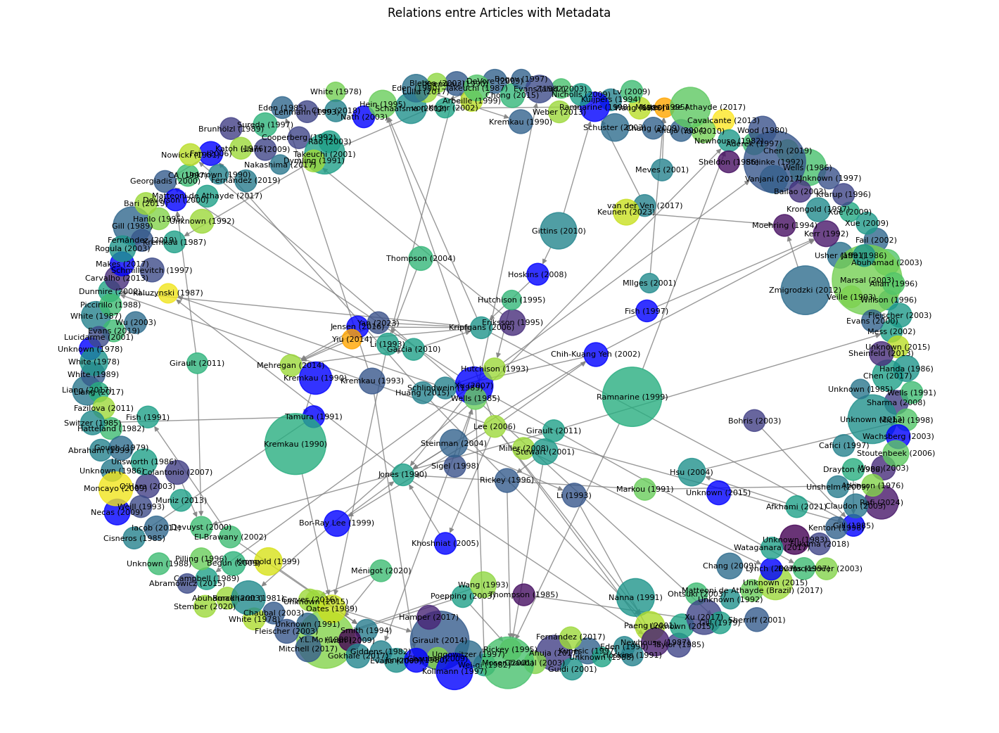

In [107]:
# Exemple d'utilisation :
#plot_graph(article_graph, filtered_dois, title="Relations entre Articles")
plot_graph(article_graph_with_metadata, filtered_dois, title="Relations entre Articles with Metadata")

## Extraction en Bibtex

In [ ]:
def save_bibtex(graph, filtered_dois, output_file="bibliography.bib"):
    """
    Enregistre les métadonnées des nœuds du graphe au format BibTeX, en se concentrant sur les nœuds principaux
    (DOIs dans `filtered_dois`) et en incluant également les nœuds supplémentaires.

    :param graph: Le graphe contenant les nœuds avec les métadonnées.
    :param filtered_dois: Liste des DOIs principaux pour identifier les nœuds principaux.
    :param output_file: Chemin du fichier pour enregistrer les entrées BibTeX.
    """
    # Identifier les nœuds principaux et les nœuds supplémentaires
    main_nodes = set(filtered_dois)
    additional_nodes = {node for node in graph.nodes if node not in main_nodes and graph.degree[node] >= 2}
    selected_nodes = main_nodes | additional_nodes

    with open(output_file, 'w', encoding='utf-8') as f:
        for node in selected_nodes:
            try:
                data = graph.nodes[node]  # Accède aux métadonnées du nœud

                # Extraire les informations
                doi = node
                title = data.get("title", "Unknown Title")
                authors = data.get("authors", [])
                authors_str = " and ".join([
                    f"{a['family']}, {a['given'][0]}." if 'family' in a and 'given' in a and a['given'] else "Unknown Author"
                    for a in authors
                ]) if authors else "Unknown Author"

                year = data.get("year", "Unknown Year")
                journal = data.get("journal", "Unknown Journal")

                # Vérifier si le titre et le DOI sont valides
                if title == "Unknown Title" or not doi:
                    print(f"Article invalide : titre ou DOI manquant pour {doi}")
                    continue

                # Calculer les connexions entrantes et sortantes
                incoming_connections = graph.in_degree(node)
                outgoing_connections = graph.out_degree(node)

                # Construire l'entrée BibTeX
                entry = f"""@article{{{doi.replace('/', '_')},
  title = {{{title}}},
  author = {{{authors_str}}},
  year = {{{year}}},
  journal = {{{journal}}},
  doi = {{{doi}}},
  incoming = {{{incoming_connections}}},
  outgoing = {{{outgoing_connections}}}
}}\n"""

                # Écrire l'entrée dans le fichier
                f.write(entry)
            except Exception as e:
                # Afficher un message d'erreur et continuer avec le prochain nœud
                print(f"Erreur lors de l'écriture de l'article {node}: {e}")

    print(f"Les métadonnées des nœuds ont été enregistrées dans le fichier {output_file}")


In [110]:
# Sauvegarder les métadonnées du graphe
save_bibtex(article_graph_with_metadata, filtered_dois, output_file="filtered_articles.bib")


Erreur lors de l'écriture de l'article 10.1371/journal.pone.0088986: 'Key 10.1371/journal.pone.0088986 not found'
Les métadonnées des nœuds ont été enregistrées dans le fichier filtered_articles.bib


## Analyse du graphe

In [111]:
num_nodes = article_graph_with_metadata.number_of_nodes()
num_edges = article_graph_with_metadata.number_of_edges()
print(f"Nombre de nœuds : {num_nodes}, Nombre d'arêtes : {num_edges}")


Nombre de nœuds : 651, Nombre d'arêtes : 503


In [112]:
density = nx.density(article_graph_with_metadata)
print(f"Densité du graphe : {density}")


Densité du graphe : 0.0011887037693489306


In [113]:
scc = list(nx.strongly_connected_components(article_graph_with_metadata))
wcc = list(nx.weakly_connected_components(article_graph_with_metadata))
print(f"Nombre de composantes fortement connectées : {len(scc)}")
print(f"Nombre de composantes faiblement connectées : {len(wcc)}")


Nombre de composantes fortement connectées : 651
Nombre de composantes faiblement connectées : 161


In [ ]:
largest_scc = max(scc, key=len)
print(f"Taille de la plus grande composante fortement connectée : {len(largest_scc)}")


Taille de la plus grande composante fortement connectée : 2


In [114]:
degree_centrality = nx.degree_centrality(article_graph_with_metadata)
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 nœuds par centralité de degré :")
for doi, centrality in top_degree:
    print(f"https://doi.org/{doi} - Centralité : {centrality:.6f}")

Top 10 nœuds par centralité de degré :
https://doi.org/10.1016/j.ultrasmedbio.2013.09.013 - Centralité : 0.070769
https://doi.org/10.1016/0301-5629(89)90070-7 - Centralité : 0.053846
https://doi.org/10.1016/j.ultrasmedbio.2006.05.003 - Centralité : 0.052308
https://doi.org/10.1016/j.ultrasmedbio.2006.04.007 - Centralité : 0.049231
https://doi.org/10.1016/0301-5629(90)90026-9 - Centralité : 0.047692
https://doi.org/10.1016/j.ultrasmedbio.2014.09.032 - Centralité : 0.046154
https://doi.org/10.1016/j.ultrasmedbio.2009.11.008 - Centralité : 0.035385
https://doi.org/10.1016/s0301-5629(00)00153-8 - Centralité : 0.030769
https://doi.org/10.1016/0301-5629(93)90087-5 - Centralité : 0.030769
https://doi.org/10.1016/s0301-5629(02)00773-1 - Centralité : 0.018462


In [115]:
betweenness_centrality = nx.betweenness_centrality(article_graph_with_metadata)
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 nœuds par centralité d'intermédiarité :")
for doi, betweenness in top_betweenness:
    print(f"https://doi.org/{doi} - Centralité d'intermédiarité : {betweenness:.6f}")


Top 10 nœuds par centralité d'intermédiarité :
https://doi.org/10.1016/j.ultrasmedbio.2013.09.013 - Centralité d'intermédiarité : 0.001899
https://doi.org/10.1016/j.ultrasmedbio.2006.04.007 - Centralité d'intermédiarité : 0.001304
https://doi.org/10.1109/tmi.2010.2049656 - Centralité d'intermédiarité : 0.000711
https://doi.org/10.1016/0301-5629(90)90026-9 - Centralité d'intermédiarité : 0.000558
https://doi.org/10.1016/0301-5629(89)90070-7 - Centralité d'intermédiarité : 0.000385
https://doi.org/10.1016/j.ultrasmedbio.2006.05.003 - Centralité d'intermédiarité : 0.000247
https://doi.org/10.1016/j.ultrasmedbio.2009.11.008 - Centralité d'intermédiarité : 0.000213
https://doi.org/10.1016/0301-5629(93)90087-5 - Centralité d'intermédiarité : 0.000152
https://doi.org/10.1016/j.ultrasmedbio.2014.09.032 - Centralité d'intermédiarité : 0.000147
https://doi.org/10.1016/j.ultrasmedbio.2010.01.003 - Centralité d'intermédiarité : 0.000128


In [116]:
hits = nx.hits(article_graph_with_metadata)
authorities = sorted(hits[1].items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 autorités :")
for doi, authority in authorities:
    print(f"https://doi.org/{doi} - Centralité d'intermédiarité : {authority:.6f}")


Top 10 autorités :
https://doi.org/10.1016/0301-5629(85)90035-3 - Centralité d'intermédiarité : 0.030268
https://doi.org/10.1016/s0301-5629(01)00405-7 - Centralité d'intermédiarité : 0.029558
https://doi.org/10.1109/58.464843 - Centralité d'intermédiarité : 0.027947
https://doi.org/10.1016/s0301-5629(00)00287-8 - Centralité d'intermédiarité : 0.027947
https://doi.org/10.1109/tbme.1987.325920 - Centralité d'intermédiarité : 0.026584
https://doi.org/10.1016/0301-5629(90)90007-y - Centralité d'intermédiarité : 0.024474
https://doi.org/10.1115/1.3138553 - Centralité d'intermédiarité : 0.024474
https://doi.org/10.1016/0041-624x(91)90092-m - Centralité d'intermédiarité : 0.024474
https://doi.org/10.1016/s0301-5629(01)00505-1 - Centralité d'intermédiarité : 0.024474
https://doi.org/10.1016/s0301-5629(99)00083-6 - Centralité d'intermédiarité : 0.024474


In [117]:
in_degrees = dict(article_graph_with_metadata.in_degree())
out_degrees = dict(article_graph_with_metadata.out_degree())
top_cited = sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
top_referents = sorted(out_degrees.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 nœuds cités :")
for doi, nb_cited in top_cited:
    print(f"https://doi.org/{doi} - score : {nb_cited:.6f}")

print("Top 10 nœuds référents :")
for doi, nb_referent in top_referents:
    print(f"https://doi.org/{doi} - score : {nb_referent:.6f}")


Top 10 nœuds cités :
https://doi.org/10.1016/0301-5629(89)90070-7 - score : 30.000000
https://doi.org/10.1016/j.ultrasmedbio.2013.09.013 - score : 27.000000
https://doi.org/10.1016/0301-5629(90)90026-9 - score : 21.000000
https://doi.org/10.1016/j.ultrasmedbio.2006.04.007 - score : 21.000000
https://doi.org/10.1016/s0301-5629(00)00153-8 - score : 20.000000
https://doi.org/10.1016/0301-5629(93)90087-5 - score : 16.000000
https://doi.org/10.1016/s0301-5629(98)00024-6 - score : 9.000000
https://doi.org/10.1016/0301-5629(92)90025-6 - score : 6.000000
https://doi.org/10.1016/0301-5629(86)90063-3 - score : 6.000000
https://doi.org/10.1016/s0301-5629(98)00096-9 - score : 6.000000
Top 10 nœuds référents :
https://doi.org/10.1016/j.ultrasmedbio.2006.05.003 - score : 32.000000
https://doi.org/10.1016/j.ultrasmedbio.2014.09.032 - score : 28.000000
https://doi.org/10.1016/j.ultrasmedbio.2013.09.013 - score : 19.000000
https://doi.org/10.1016/j.ultrasmedbio.2009.11.008 - score : 18.000000
https://d

In [118]:
from networkx.algorithms.community import greedy_modularity_communities

# Appliquer l'algorithme de détection de communautés
communities = list(greedy_modularity_communities(article_graph_with_metadata))

# Afficher le nombre de communautés détectées
print(f"Nombre de communautés détectées : {len(communities)}")

# Afficher les premières communautés
for i, comm in enumerate(communities[:5]):  # Afficher les 5 premières communautés
    print(f"Communauté {i+1} ({len(comm)} nœuds) :")
    for doi in list(comm):
        print(f"https://doi.org/{doi}")


Nombre de communautés détectées : 169
Communauté 1 (45 nœuds) :
https://doi.org/10.1016/0301-5629(91)90102-3
https://doi.org/10.1016/0301-5629(91)90085-b
https://doi.org/10.1016/0301-5629(89)90070-7
https://doi.org/10.1007/bf02510961
https://doi.org/10.1016/j.ultrasmedbio.2016.12.015
https://doi.org/10.1016/s0010-4825(01)00005-1
https://doi.org/10.1016/0010-4825(95)00024-x
https://doi.org/10.1177/14759217211061518
https://doi.org/10.3414/me16-01-0026
https://doi.org/10.1016/s0010-4825(02)00036-7
https://doi.org/10.1109/58.63118
https://doi.org/10.1007/bf02442271
https://doi.org/10.1016/j.compbiomed.2005.01.007
https://doi.org/10.1109/tuffc.2002.1009327
https://doi.org/10.1109/10.284968
https://doi.org/10.1109/tuffc.2009.1093
https://doi.org/10.1016/0301-5629(94)90098-1
https://doi.org/10.1016/s0301-5629(01)00459-8
https://doi.org/10.1109/10.135539
https://doi.org/10.1016/0301-5629(90)90089-u
https://doi.org/10.1016/0169-2607(95)01702-x
https://doi.org/10.1016/0301-5629(90)90020-d
https

In [121]:
cycles = list(nx.simple_cycles(article_graph_with_metadata))
print(f"Nombre de cycles détectés : {len(cycles)}")
for cycle in cycles[:5]:  # Afficher les premiers cycles
    print("Cycle :")
    for doi in cycle:
      print(f"https://doi.org/{doi}")


Nombre de cycles détectés : 0


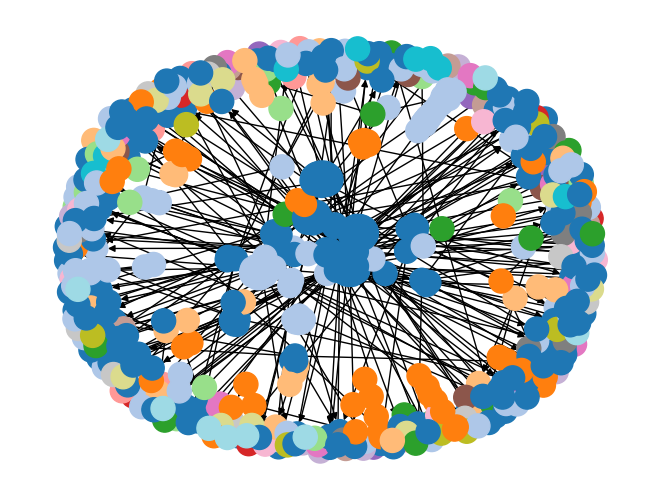

In [122]:
import matplotlib.pyplot as plt
from matplotlib.cm import tab20

community_colors = {node: i for i, comm in enumerate(communities) for node in comm}
node_colors = [community_colors[node] for node in article_graph_with_metadata.nodes if node in community_colors]
nx.draw(
    article_graph_with_metadata,
    with_labels=False,
    node_color=node_colors,
    cmap=tab20
)
plt.show()


In [123]:
with open("graph_analysis.txt", "w") as f:
    f.write(f"Nombre de nœuds : {num_nodes}\n")
    f.write(f"Nombre d'arêtes : {num_edges}\n")
    f.write(f"Densité : {density}\n")
    f.write(f"Top 10 nœuds par centralité de degré : {top_degree}\n")
    f.write(f"Top 10 nœuds cités : {top_cited}\n")
    f.write(f"Top 10 nœuds référents : {top_referents}\n")
